In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

dff=pd.read_csv("C:/Users/USER/Downloads/Merged_Taiga_Goose_ERA5_Cleaned (1).csv")

In [2]:
dff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840212 entries, 0 to 840211
Data columns (total 28 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   event-id                         840212 non-null  int64  
 1   visible                          840212 non-null  bool   
 2   timestamp                        840212 non-null  object 
 3   location-long                    840212 non-null  float64
 4   location-lat                     840212 non-null  float64
 5   external-temperature             840212 non-null  float64
 6   gps:hdop                         840212 non-null  float64
 7   gps:satellite-count              840212 non-null  float64
 8   ground-speed                     840212 non-null  float64
 9   heading                          840212 non-null  float64
 10  height-above-ellipsoid           840212 non-null  float64
 11  sensor-type                      840212 non-null  object 
 12  in

In [3]:
print(dff.describe())

           event-id  location-long   location-lat  external-temperature  \
count  8.402120e+05  840212.000000  840212.000000         840212.000000   
mean   1.772610e+10      49.211483      72.101289             13.124546   
std    5.728257e+06      12.395345       4.276370              5.988180   
min    1.770443e+10      13.525927      55.470840             -5.000000   
25%    1.772661e+10      52.764491      72.351357              9.000000   
50%    1.772682e+10      55.167532      73.950688             12.000000   
75%    1.772731e+10      56.019547      74.794647             16.000000   
max    1.773164e+10      58.737148      75.674942             53.000000   

            gps:hdop  gps:satellite-count   ground-speed       heading  \
count  840212.000000        840212.000000  840212.000000  840212.00000   
mean        1.079257             7.527806       0.494217     178.75023   
std         0.346547             2.571375      20.015578     102.34053   
min         0.500000        

In [4]:
# List of numerical columns to clean
numerical_cols = dff.select_dtypes(include=['number']).columns

def replace_outliers(dff, cols, method="median"):
    cleaned_df = dff.copy()
    for col in cols:
        Q1 = cleaned_df[col].quantile(0.25)
        Q3 = cleaned_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        if method == "median":
            replacement = cleaned_df[col].median()
        elif method == "mean":
            replacement = cleaned_df[col].mean()
        else:
            continue

        cleaned_df[col] = np.where((cleaned_df[col] < lower_bound) | (cleaned_df[col] > upper_bound), replacement, cleaned_df[col])
    return cleaned_df

df_cleaned = replace_outliers(dff, numerical_cols, method="median")  # Replace outliers with median

# Save the cleaned dataset
df_cleaned.to_csv("nw_data.csv", index=False)

print(f"Original dataset size: {dff.shape[0]} rows")
print(f"Cleaned dataset size: {df_cleaned.shape[0]} rows")

Original dataset size: 840212 rows
Cleaned dataset size: 840212 rows


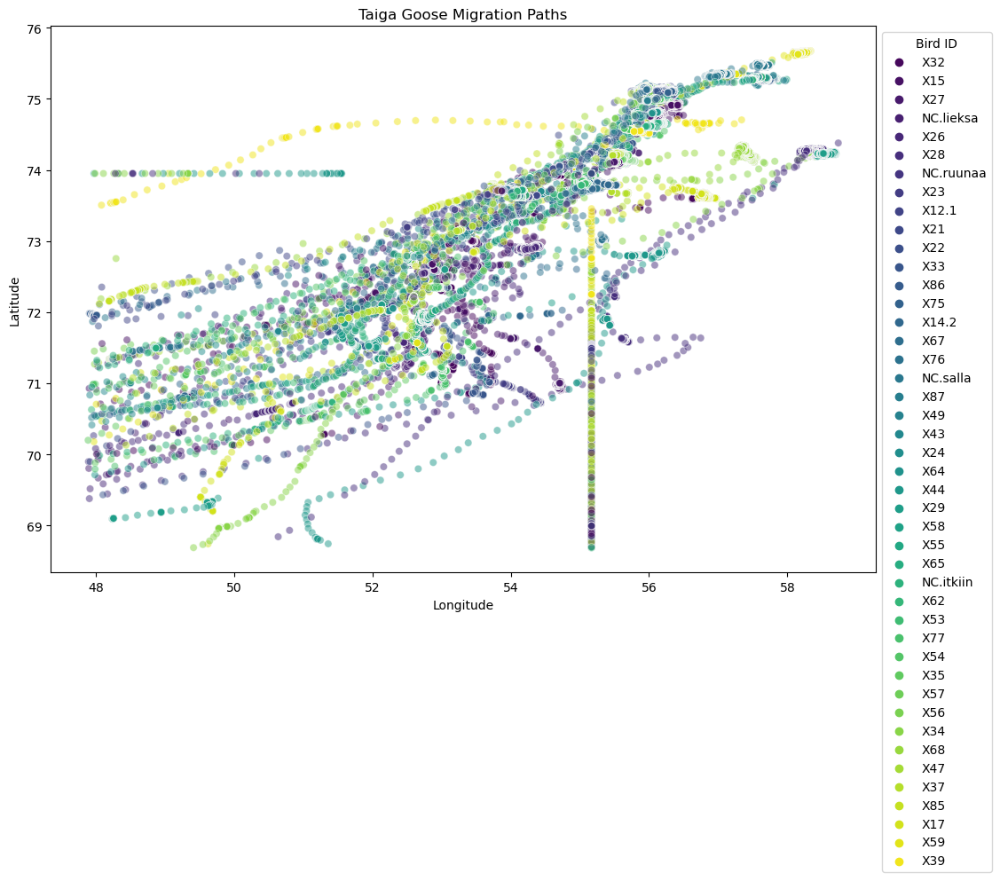

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df_cleaned, 
    x="location-long", 
    y="location-lat", 
    hue="individual-local-identifier", 
    alpha=0.5, 
    palette="viridis"
)
plt.title("Taiga Goose Migration Paths")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Bird ID", bbox_to_anchor=(1, 1))
plt.show()

In [6]:
!pip install geopy

In [7]:
import geopy.distance

def haversine(lat1, lon1, lat2, lon2):
    coords_1 = (lat1, lon1)
    coords_2 = (lat2, lon2)
    return geopy.distance.geodesic(coords_1, coords_2).km

# Calculate the distance between each point and the next
distances = [haversine(df_cleaned['location-lat'][i], df_cleaned['location-long'][i], df_cleaned['location-lat'][i+1], df_cleaned['location-long'][i+1]) for i in range(len(df_cleaned)-1)]

# Set a threshold for reasonable movement, for example, 50 km (you can adjust this threshold)
threshold = 50  # in km
outliers = [i for i, dist in enumerate(distances) if dist > threshold]

# Print only the first 10 outliers
print("Outlier indices:", outliers[:10])

Outlier indices: [4118, 4119, 4123, 4124, 4129, 4130, 4134, 4135, 4139, 4140]


In [8]:
# Check for missing data in the latitude and longitude columns
missing_lat = df_cleaned['location-lat'].isnull().sum()
missing_long = df_cleaned['location-long'].isnull().sum()

print(f"Missing latitude data: {missing_lat}")
print(f"Missing longitude data: {missing_long}")

Missing latitude data: 0
Missing longitude data: 0


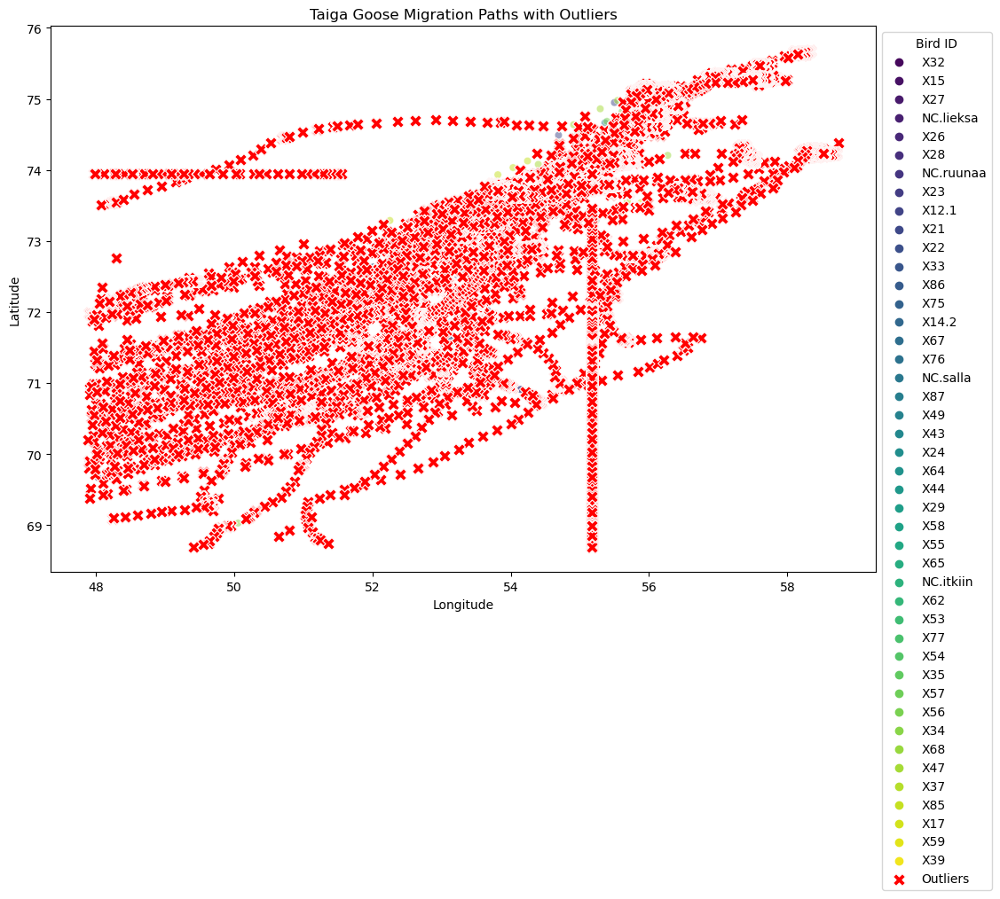

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data to show the outliers
outlier_data = df_cleaned.iloc[outliers]

# Plot migration paths including outliers
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df_cleaned, 
    x="location-long", 
    y="location-lat", 
    hue="individual-local-identifier", 
    alpha=0.5, 
    palette="viridis"
)
sns.scatterplot(
    data=outlier_data, 
    x="location-long", 
    y="location-lat", 
    color="red", 
    label="Outliers", 
    marker="X", 
    s=100
)
plt.title("Taiga Goose Migration Paths with Outliers")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Bird ID", bbox_to_anchor=(1, 1))
plt.show()

Shape of cleaned data: (323669, 28)


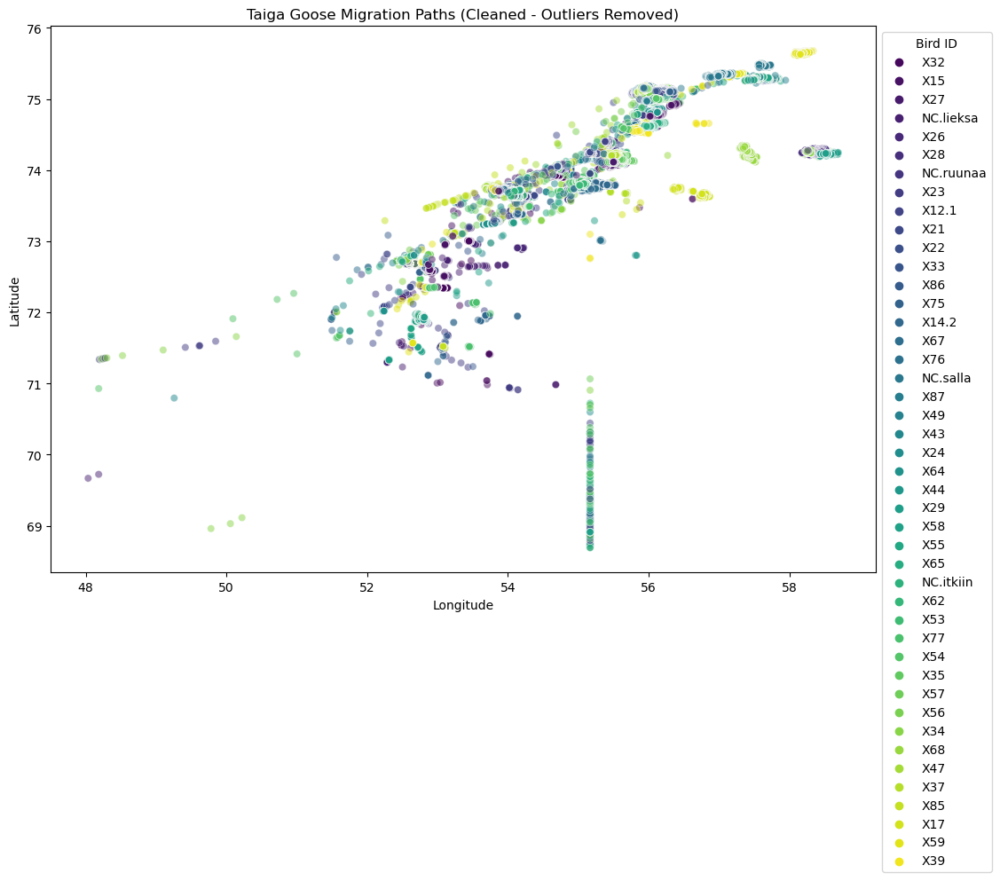

In [10]:
# Remove the rows corresponding to the outliers
df_clean = df_cleaned.drop(df_cleaned.index[outliers])

# Confirm the number of rows after cleaning
print(f"Shape of cleaned data: {df_clean.shape}")

# Plot the cleaned data
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df_clean, 
    x="location-long", 
    y="location-lat", 
    hue="individual-local-identifier", 
    alpha=0.5, 
    palette="viridis"
)
plt.title("Taiga Goose Migration Paths (Cleaned - Outliers Removed)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Bird ID", bbox_to_anchor=(1, 1))
plt.show()

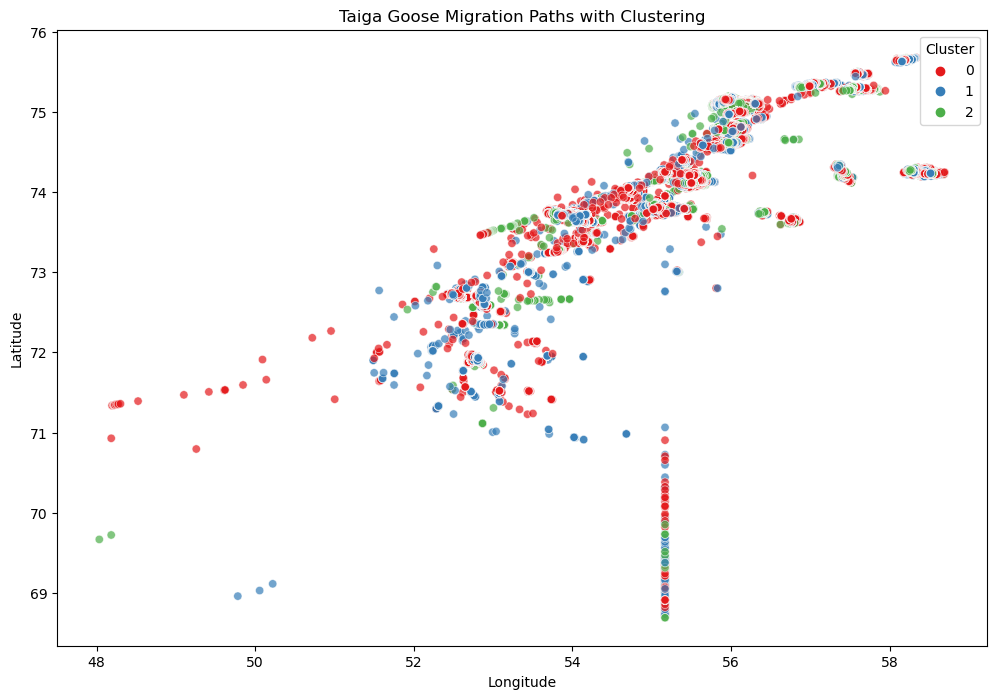

In [11]:
# Handle NaN values (if there are any)
# Option 1: Drop rows with NaN values
df_clean.dropna(subset=['u10', 'v10'], inplace=True)

# Option 2: Alternatively, you can fill NaN values with the mean or median of the column
# df_clean['speed'].fillna(df_clean['speed'].mean(), inplace=True)
# df_clean['direction'].fillna(df_clean['direction'].mean(), inplace=True)

# Apply KMeans clustering on the 'speed' and 'direction' columns
from sklearn.cluster import KMeans

# Define the features for clustering
clustering_data = df_clean[['u10', 'v10']]

# Initialize KMeans with 3 clusters (you can change the number of clusters if needed)
kmeans = KMeans(n_clusters=3, random_state=42)

# Perform clustering and assign the cluster labels to the dataframe
df_clean['cluster'] = kmeans.fit_predict(clustering_data)

# Step 2: Visualize the clusters
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the clusters using the longitude and latitude, colored by the cluster labels
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_clean, x='location-long', y='location-lat', hue='cluster', palette='Set1', alpha=0.7)
plt.title('Taiga Goose Migration Paths with Clustering')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.show()

              u10                 v10          
             mean       std      mean       std
cluster                                        
0       -0.519112  2.845264  3.446942  3.101774
1       -0.819045  3.256716 -4.919033  3.038659
2        6.363876  2.488453  0.844017  4.116418


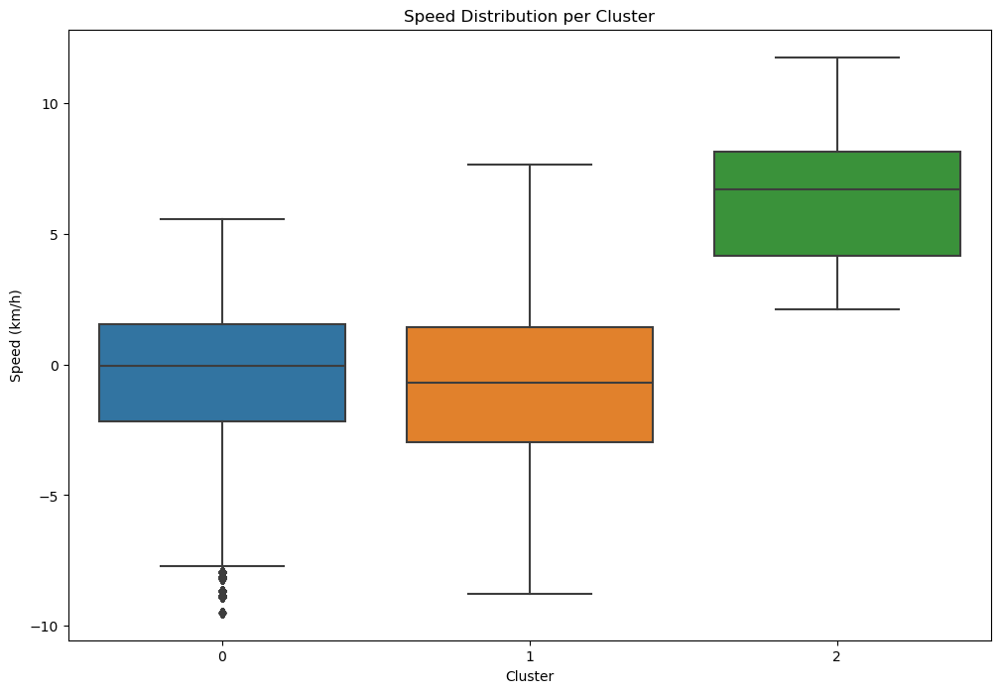

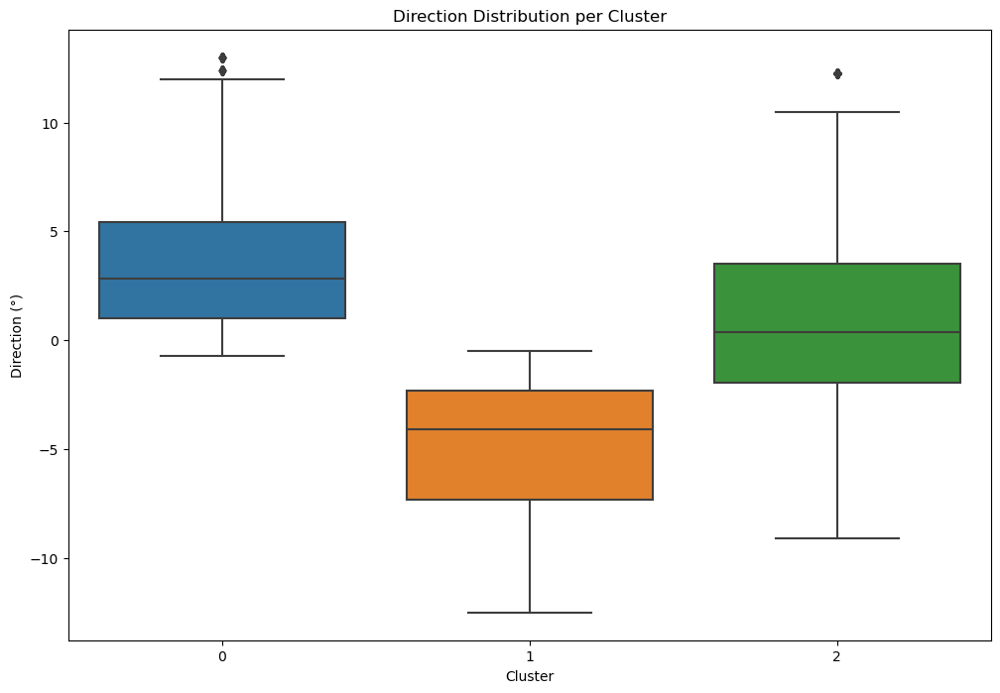

In [12]:
import pandas as pd

# Assuming df_clean has a 'cluster' column from KMeans clustering

# 1. Analyzing average speed and direction per cluster
cluster_analysis = df_clean.groupby('cluster')[['u10', 'v10']].agg(['mean', 'std'])

# Display cluster analysis (average speed and direction for each cluster)
print(cluster_analysis)

# 2. Visualize the clusters by speed and direction
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the distribution of speed for each cluster
plt.figure(figsize=(12, 8))
sns.boxplot(x='cluster', y='u10', data=df_clean)
plt.title('Speed Distribution per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Speed (km/h)')
plt.show()

# Plotting the distribution of direction for each cluster
plt.figure(figsize=(12, 8))
sns.boxplot(x='cluster', y='v10', data=df_clean)
plt.title('Direction Distribution per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Direction (°)')
plt.show()

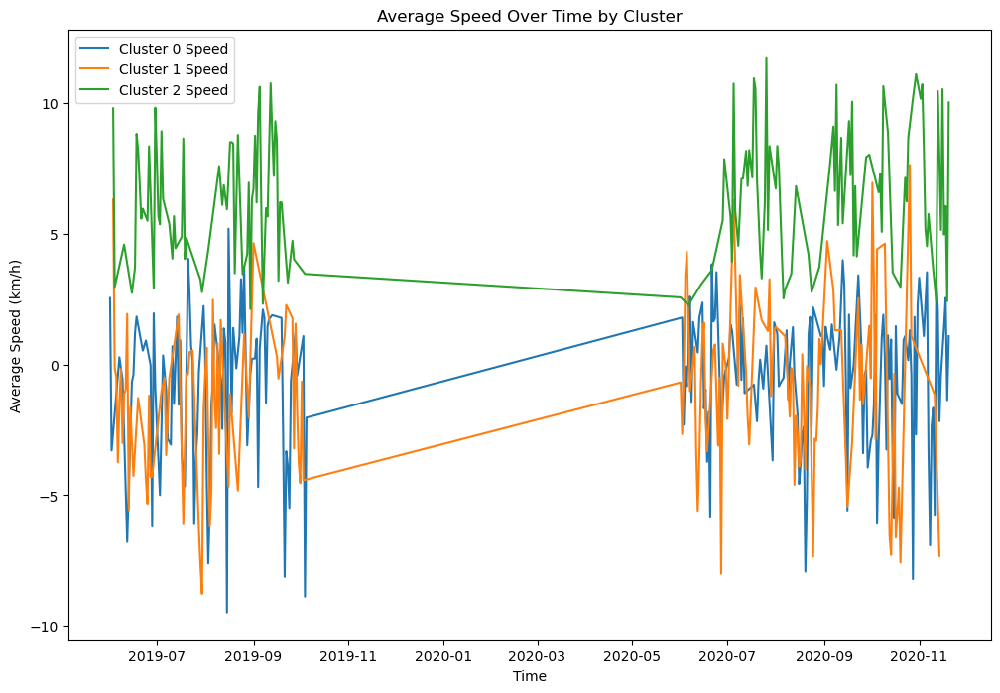

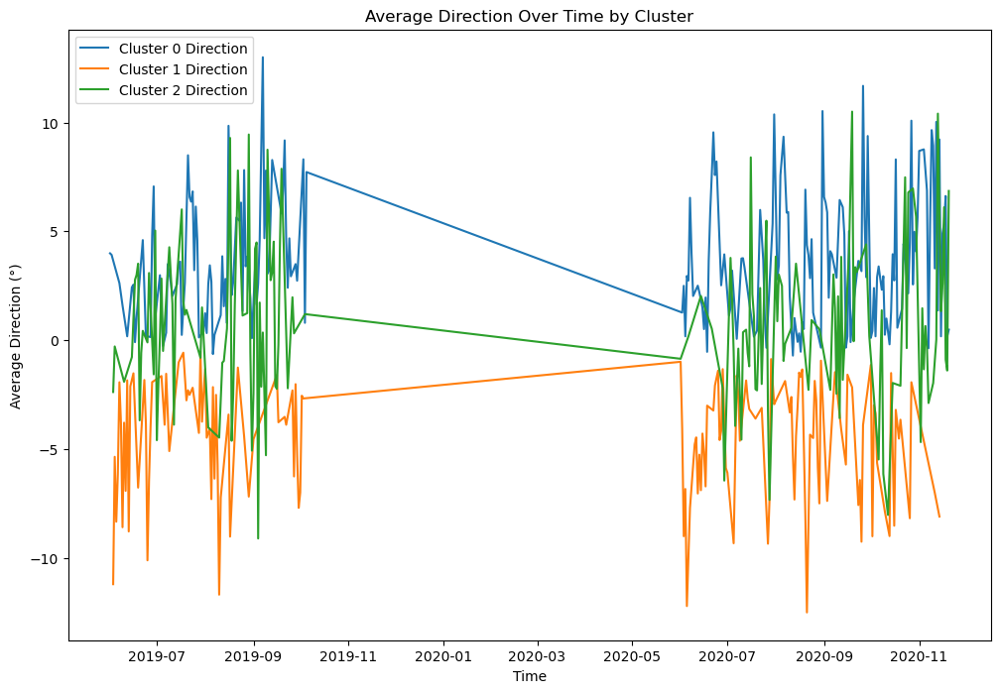

In [13]:
# Group by cluster and timestamp to get the average speed and direction over time
df_clean['timestamp'] = pd.to_datetime(df_clean['timestamp'])  # Ensure timestamp is datetime type
cluster_time_analysis = df_clean.groupby([df_clean['timestamp'].dt.date, 'cluster'])[['u10', 'v10']].mean().reset_index()

# Plotting Speed over Time for each Cluster
plt.figure(figsize=(12, 8))
for cluster in cluster_time_analysis['cluster'].unique():
    cluster_data = cluster_time_analysis[cluster_time_analysis['cluster'] == cluster]
    plt.plot(cluster_data['timestamp'], cluster_data['u10'], label=f'Cluster {cluster} Speed')
plt.title('Average Speed Over Time by Cluster')
plt.xlabel('Time')
plt.ylabel('Average Speed (km/h)')
plt.legend()
plt.show()

# Plotting Direction over Time for each Cluster
plt.figure(figsize=(12, 8))
for cluster in cluster_time_analysis['cluster'].unique():
    cluster_data = cluster_time_analysis[cluster_time_analysis['cluster'] == cluster]
    plt.plot(cluster_data['timestamp'], cluster_data['v10'], label=f'Cluster {cluster} Direction')
plt.title('Average Direction Over Time by Cluster')
plt.xlabel('Time')
plt.ylabel('Average Direction (°)')
plt.legend()
plt.show()

In [14]:
from sklearn.cluster import MiniBatchKMeans
import folium
from folium.plugins import MarkerCluster

clustering = df_clean[['u10', 'v10']]
kmeans = MiniBatchKMeans(n_clusters=3, random_state=42, batch_size=1000)
df_clean['cluster'] = kmeans.fit_predict(clustering_data)

df_sampled = df_clean.sample(n=1000, random_state=42)

map_center = [df_sampled['location-lat'].mean(), df_sampled['location-long'].mean()]
my_map = folium.Map(location=map_center, zoom_start=6)

marker_cluster = MarkerCluster().add_to(my_map)

for idx, row in df_sampled.iterrows():
    folium.CircleMarker(
        location=[row['location-lat'], row['location-long']],
        radius=5,
        color='blue' if row['cluster'] == 0 else ('red' if row['cluster'] == 1 else 'green'),
        fill=True,
        fill_opacity=0.6,
        popup=f"Cluster {row['cluster']}"
    ).add_to(marker_cluster)
("C:/Users/USER/Downloads/Merged_Taiga_Goose_ERA5_Cleaned (1).csv")
output_path = "C:/Users/USER/Downloads/Taiga_Goose_Clusters_Map_Optimize.html"
my_map.save(output_path)

print(f"Map has been saved to: {output_path}")

Map has been saved to: C:/Users/USER/Downloads/Taiga_Goose_Clusters_Map_Optimize.html


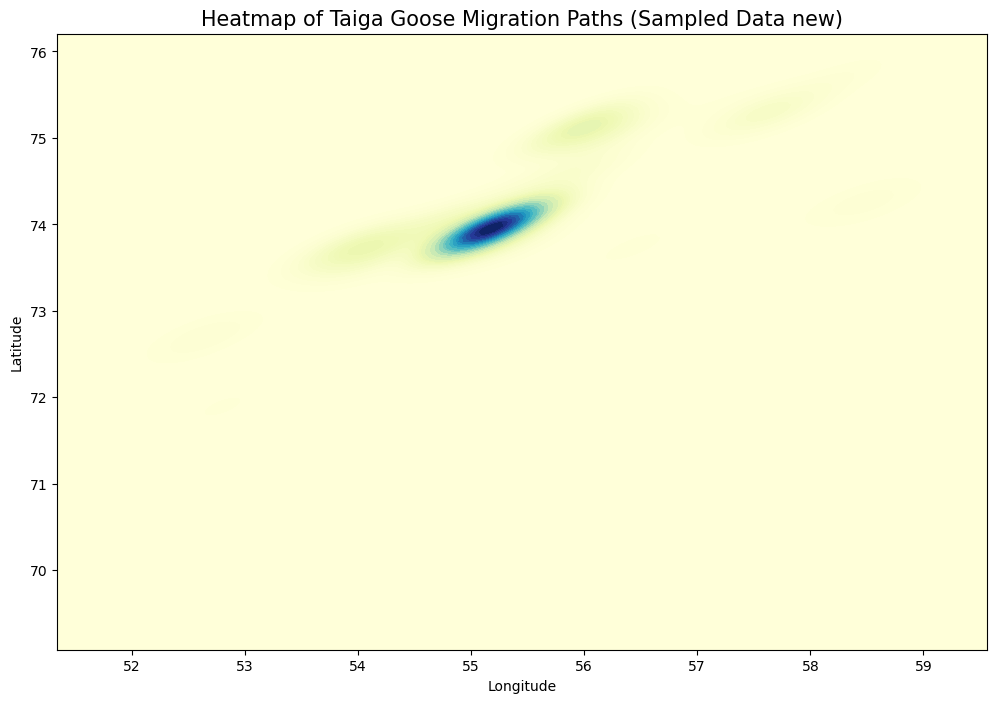

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sampling 
df_sample = df_clean.sample(n=1000, random_state=42)  # You can adjust the number (1000) as per your system capacity

# Create a heatmap of the migration paths based on longitude and latitude
plt.figure(figsize=(12, 8))
sns.kdeplot(
    data=df_sample, 
    x='location-long', 
    y='location-lat', 
    cmap="YlGnBu", 
    fill=True, 
    thresh=0, 
    levels=30  # Lower number of levels for smoother heatmap
)

# Customize plot
plt.title('Heatmap of Taiga Goose Migration Paths (Sampled Data new)', fontsize=15)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [16]:
import folium
from folium.plugins import HeatMap

# Sampling a smaller portion of the data
df_sample = df_clean.sample(n=1000, random_state=42)  # Adjust the number as needed

# Create a map centered around the average latitude and longitude
map_center = [df_sample['location-lat'].mean(), df_sample['location-long'].mean()]
my_map = folium.Map(location=map_center, zoom_start=6)

# Prepare the data for heatmap (list of latitudes and longitudes)
heat_data = [[row['location-lat'], row['location-long']] for index, row in df_sample.iterrows()]

# Add the heatmap layer
HeatMap(heat_data, radius=10, blur=15).add_to(my_map)

# Save the map to an HTML file
output_path = "C:/Users/USER/Downloads/Taiga_Goose_Heatmap_Sample.html"
my_map.save(output_path)

print(f"Heatmap saved to: {output_path}")

Heatmap saved to: C:/Users/USER/Downloads/Taiga_Goose_Heatmap_Sample.html


In [17]:
import folium
from folium.plugins import HeatMap, MarkerCluster

# Sampling a smaller portion of the data
df_sample = df_clean.sample(n=1000, random_state=42)  # You can adjust the number as needed

# Create a map centered around the average latitude and longitude
map_center = [df_sample['location-lat'].mean(), df_sample['location-long'].mean()]
my_map = folium.Map(location=map_center, zoom_start=6)

# Create MarkerCluster to group close locations
marker_cluster = MarkerCluster().add_to(my_map)

# Add markers for each bird's migration point, colored by the cluster
for idx, row in df_sampled.iterrows():
    folium.CircleMarker(
        location=[row['location-lat'], row['location-long']],
        radius=5,
        color='blue' if row['cluster'] == 0 else ('red' if row['cluster'] == 1 else 'green'),
        fill=True,
        fill_opacity=0.6,
        popup=f"Cluster {row['cluster']}, Bird ID: {row['individual-local-identifier']}, Speed: {row['u10']}, Direction: {row['v10']}"
    ).add_to(marker_cluster)

# Prepare the data for the heatmap (list of latitudes and longitudes)
heat_data = [[row['location-lat'], row['location-long']] for index, row in df_sample.iterrows()]

# Add the heatmap layer
HeatMap(heat_data, radius=10, blur=15).add_to(my_map)

# Save the map to an HTML file
output_path = "C:/Users/USER/Downloads/Taiga_Goose_Heatmap_Clusters.html"
my_map.save(output_path)

print(f"Heatmap with Clusters saved to: {output_path}")

Heatmap with Clusters saved to: C:/Users/USER/Downloads/Taiga_Goose_Heatmap_Clusters.html


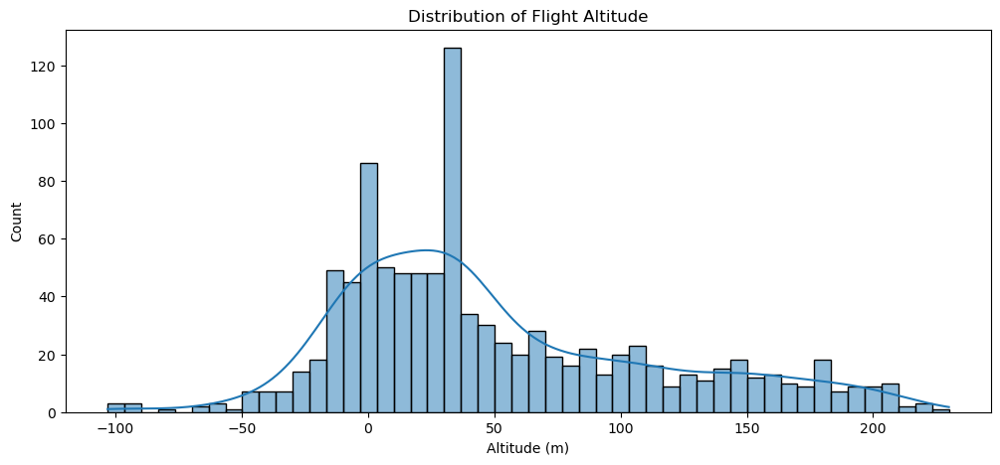

In [18]:
plt.figure(figsize=(12, 5))
sns.histplot(df_sample["height-above-ellipsoid"], bins=50, kde=True)
plt.title("Distribution of Flight Altitude")
plt.xlabel("Altitude (m)")
plt.show()

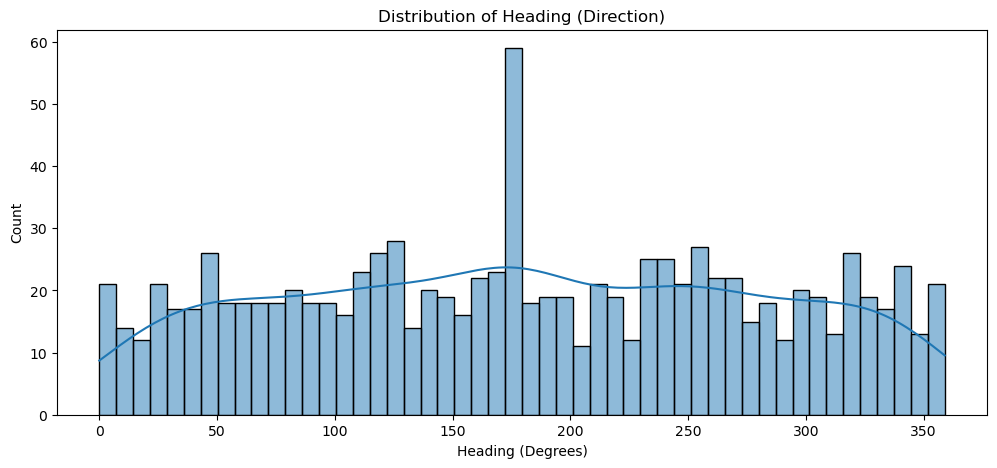

In [19]:
plt.figure(figsize=(12, 5))
sns.histplot(df_sample["heading"], bins=50, kde=True)
plt.title("Distribution of Heading (Direction)")
plt.xlabel("Heading (Degrees)")
plt.show()

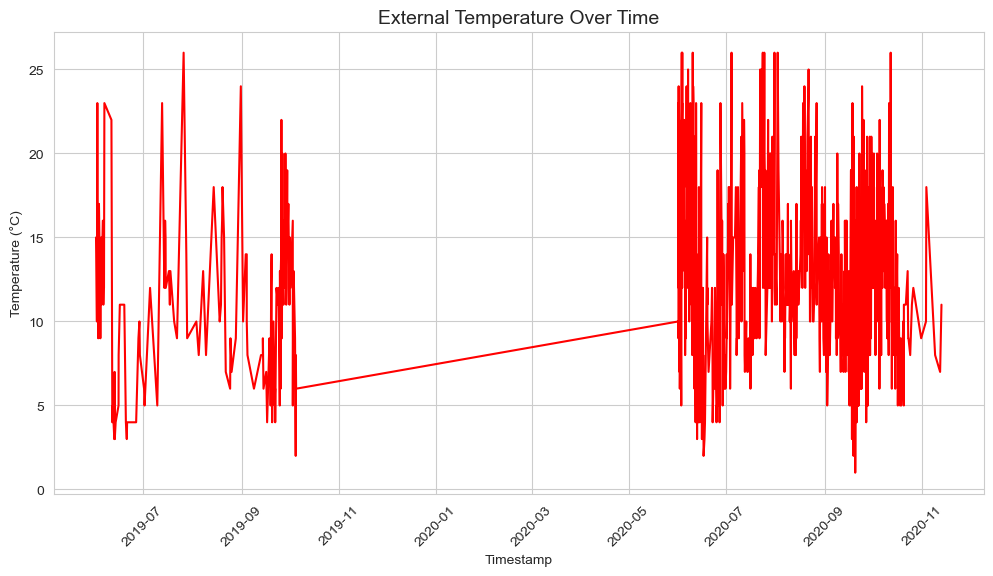

In [20]:
# Set a colorful style
sns.set_style("whitegrid")
plt.rcParams["axes.prop_cycle"] = plt.cycler(color=sns.color_palette("tab10"))

# Temperature Over Time
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_sample, x="timestamp", y="external-temperature", color="red", linewidth=1.5)
plt.title("External Temperature Over Time", fontsize=14)
plt.xlabel("Timestamp")
plt.ylabel("Temperature (°C)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

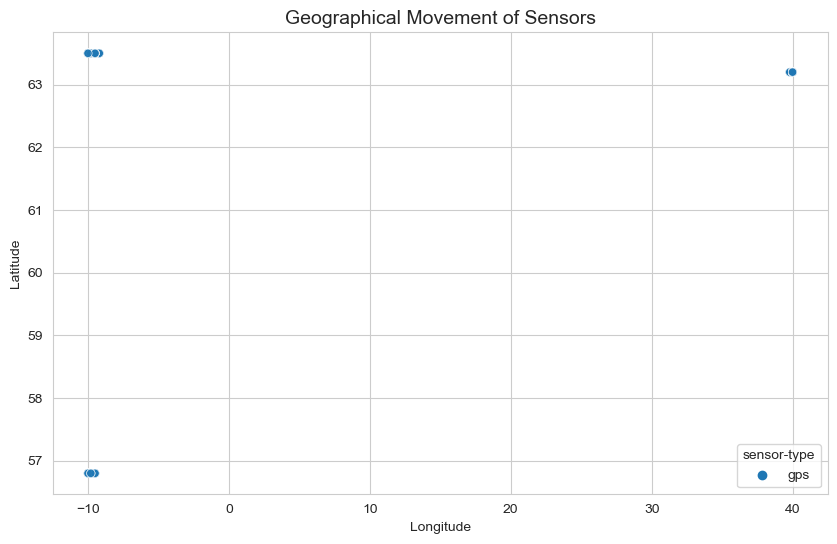

In [21]:
# Longitude vs. Latitude 
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_sample, x="longitude", y="latitude", hue="sensor-type", alpha=0.7)
plt.title("Geographical Movement of Sensors", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show



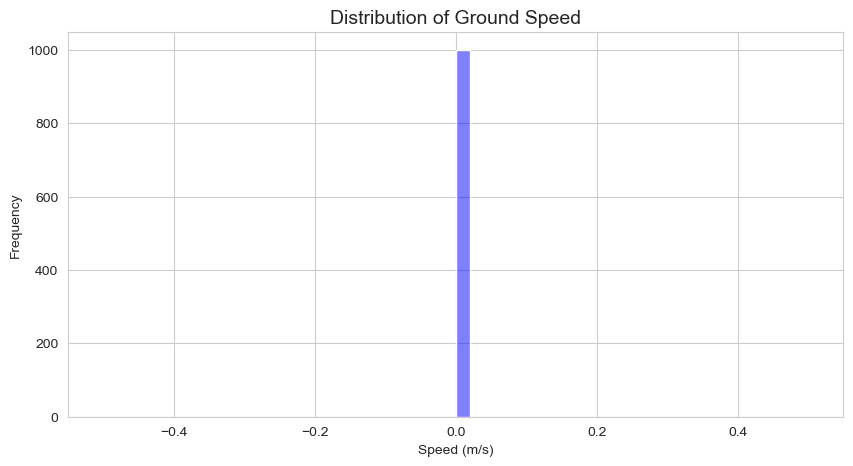

In [22]:
# Distribution of Ground Speed 
plt.figure(figsize=(10, 5))
sns.histplot(df_sample["ground-speed"], bins=50, kde=True, color="blue")
plt.title("Distribution of Ground Speed", fontsize=14)
plt.xlabel("Speed (m/s)")
plt.ylabel("Frequency")
plt.show()

In [23]:
# Visualizing movement trajectory
mapvisual = folium.Map(location=[df_cleaned["latitude"].mean(), df_cleaned["longitude"].mean()], zoom_start=5)
for _, row in df_cleaned.sample(15000).iterrows():
    folium.CircleMarker([row["latitude"], row["longitude"]], radius=5, color="red").add_to(mapvisual)
mapvisual.save("goose_trajectory_map.html")
mapvisual

In [24]:
df_cleane = df_cleaned.drop(['event-id', 'visible', 'sensor-type', 'individual-taxon-canonical-name', 'individual-local-identifier', 'study-name', 'era5_nearest_time', 'number_y', 'expver_y', 'number_x', 'expver_x', 'ground-speed'], axis=1)
df_clean= df_cleane.copy()
df_clean = df_clean.drop(['timestamp'], axis=1)


In [25]:
df_clns = df_clean.apply(pd.to_numeric, errors='coerce')  # Convert where possible
correlation_numeric = df_clns.corr()

print(correlation_numeric)

                        location-long  location-lat  external-temperature  \
location-long                1.000000      0.630118              0.215024   
location-lat                 0.630118      1.000000              0.232307   
external-temperature         0.215024      0.232307              1.000000   
gps:hdop                    -0.009236     -0.011289             -0.019944   
gps:satellite-count         -0.000590      0.011147              0.040031   
heading                      0.012773      0.022226             -0.001206   
height-above-ellipsoid      -0.017175     -0.057783             -0.005487   
tag-local-identifier         0.142812      0.214028              0.066321   
latitude                    -0.000119     -0.000426             -0.047719   
longitude                    0.008644      0.008306             -0.038911   
tp                           0.001663      0.020474              0.019989   
u10                          0.056646      0.061097              0.017062   

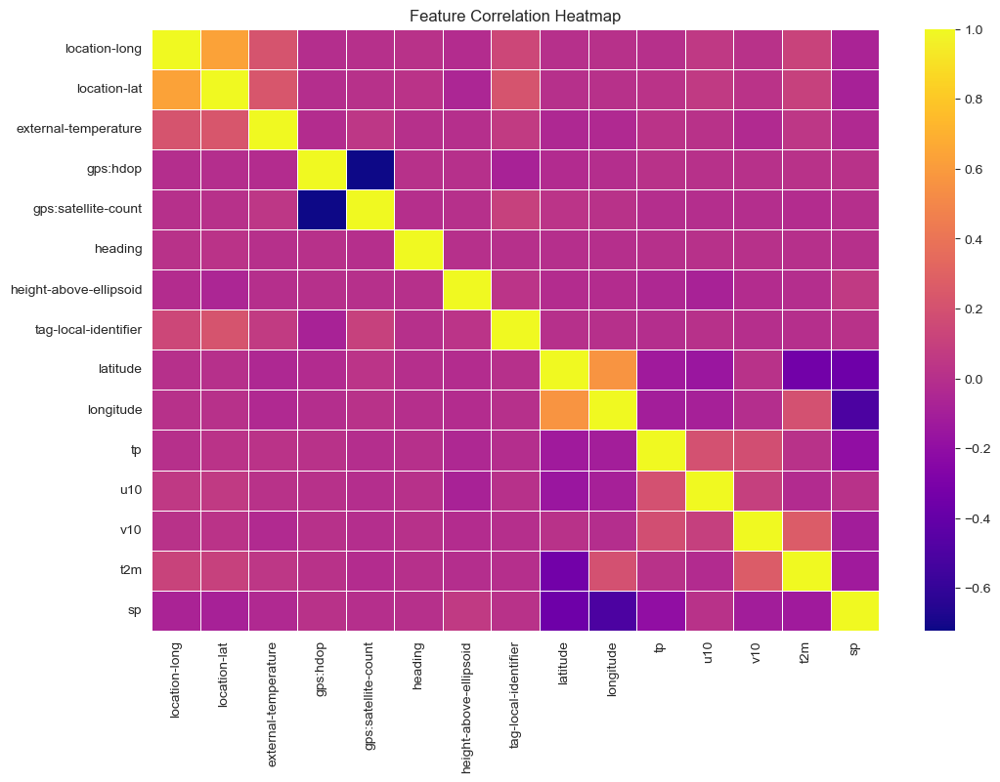

In [26]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_numeric, annot=False, cmap="plasma", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

In [27]:
df = df_clean.copy()

#'timestamp' is present, and kept for ARIMA 
drop_cols = ["sensor-type", "event-id", "visible", "individual-taxon-canonical-name",
             "individual-local-identifier", "study-name", "era5_nearest_time",
             "number_x", "expver_x", "number_y", "expver_y", "ground-speed"]
df.drop(columns=[c for c in drop_cols if c in df.columns], errors="ignore", inplace=True)

print("Columns in final df:", df.columns)



Columns in final df: Index(['location-long', 'location-lat', 'external-temperature', 'gps:hdop',
       'gps:satellite-count', 'heading', 'height-above-ellipsoid',
       'tag-local-identifier', 'latitude', 'longitude', 'tp', 'u10', 'v10',
       't2m', 'sp'],
      dtype='object')


In [28]:
# For multi-output models, we define:
feature_cols = [c for c in df.columns if c not in ["latitude", "longitude", "timestamp"]]
X = df[feature_cols].dropna()  # numeric features
y = df[["latitude", "longitude"]].dropna()



In [29]:
# Align X and Y
X = X.loc[y.index]
y= y.loc[X.index]


In [30]:
print("X shape:", X.shape)
print("Y shape:", y.shape)

X shape: (840212, 13)
Y shape: (840212, 2)


In [31]:
from sklearn.model_selection import train_test_split

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, accuracy_score

# Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [33]:
y_pred_rf = rf.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
print(f"Random Forest MSE:  {mse_rf:.4f}")
print(f"Random Forest RMSE: {rmse_rf:.4f}")

Random Forest MSE:  0.0075
Random Forest RMSE: 0.0868


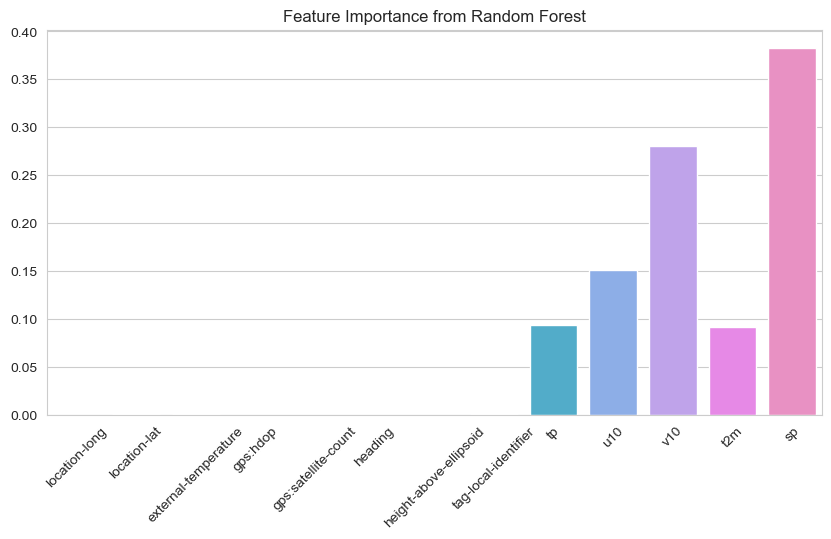

In [34]:
# Get feature importance
feature_importance = rf.feature_importances_

# Plot feature importance
plt.figure(figsize=(10, 5))
sns.barplot(x=X.columns, y=feature_importance)
plt.xticks(rotation=45)
plt.title("Feature Importance from Random Forest")
plt.show()

In [35]:
# Gradient Boosting
# Since GradientBoostingRegressor is not natively multi-output, MultiOutputRegressor is used to handle 2D target
from sklearn.multioutput import MultiOutputRegressor

gbr = GradientBoostingRegressor(n_estimators=100, random_state=42)
gbr_multi = MultiOutputRegressor(gbr)
gbr_multi.fit(X_train, y_train)

MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42))

In [36]:
y_pred_gbr = gbr_multi.predict(X_test)
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
rmse_gbr = np.sqrt(mse_gbr)
print(f"Gradient Boosting MSE:  {mse_gbr:.4f}")
print(f"Gradient Boosting RMSE: {rmse_gbr:.4f}")

Gradient Boosting MSE:  23.8076
Gradient Boosting RMSE: 4.8793


In [37]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def create_sequences(X, y, seq_length=7):
    X_df = pd.DataFrame(X, index=Y.index) if not isinstance(X, pd.DataFrame) else X
    Y_df = pd.DataFrame(y) if not isinstance(y, pd.DataFrame) else y
    Xs, Ys = [], []
    for i in range(len(X_df) - seq_length):
        X_seq = X_df.iloc[i : i + seq_length].values
        Y_seq = Y_df.iloc[i + seq_length].values
        Xs.append(X_seq)
        Ys.append(Y_seq)
    return np.array(Xs), np.array(Ys)

# Recreate X, Y for LSTM 
X_lstm = X.copy()
Y_lstm = y.copy()

In [38]:
seq_length = 7
X_seq, Y_seq = create_sequences(X_lstm, Y_lstm, seq_length=seq_length)
print("LSTM X_seq shape:", X_seq.shape)
print("LSTM Y_seq shape:", Y_seq.shape)  
X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(
    X_seq, Y_seq, test_size=0.2, random_state=42
)

LSTM X_seq shape: (840205, 7, 13)
LSTM Y_seq shape: (840205, 2)


In [39]:
# LSTM
model = Sequential()
model.add(LSTM(64, input_shape=(seq_length, X.shape[1]), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(32))
model.add(Dropout(0.2))
model.add(Dense(2))  # latitude, longitude prediction

model.compile(optimizer=Adam(learning_rate=0.001), loss="mse")
model.summary()
history = model.fit(
    X_train_lstm, y_train_lstm,
    epochs=10,
    batch_size=32,
    validation_split=0.1,
    shuffle=False
)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 7, 64)               │          19,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 7, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2)                   │              66 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,450 (126.76 KB)

 Trainable params: 32,450 (126.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 149s 8ms/step - loss: 441.9167 - val_loss: 239.1776
Epoch 2/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 114s 6ms/step - loss: 250.9487 - val_loss: 239.2487
Epoch 3/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 115s 6ms/step - loss: 248.4114 - val_loss: 239.1669
Epoch 4/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 127s 7ms/step - loss: 246.2727 - val_loss: 239.1301
Epoch 5/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 145s 8ms/step - loss: 244.5822 - val_loss: 239.1526
Epoch 6/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 133s 7ms/step - loss: 243.2541 - val_loss: 239.1252
Epoch 7/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 139s 7ms/step - loss: 242.3134 - val_loss: 239.1245
Epoch 8/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 154s 8ms/step - loss: 241.6145 - val_loss: 239.1243
Epoch 9/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 120s 6ms/step - loss: 241.1350 - val_loss: 239.1223
Epoch 10/10
18905/18905 ━━━━━━━━━━━━━━━━━━━━ 128s 7ms/step - loss: 240.8264 - val_loss: 239.1161


In [40]:
# Predict and Evaluate
y_pred_lstm = model.predict(X_test_lstm)
mse_lstm = mean_squared_error(y_test_lstm, y_pred_lstm)
rmse_lstm = np.sqrt(mse_lstm)
print(f"LSTM MSE:  {mse_lstm:.4f}")
print(f"LSTM RMSE: {rmse_lstm:.4f}")

5252/5252 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step
LSTM MSE:  240.2746
LSTM RMSE: 15.5008


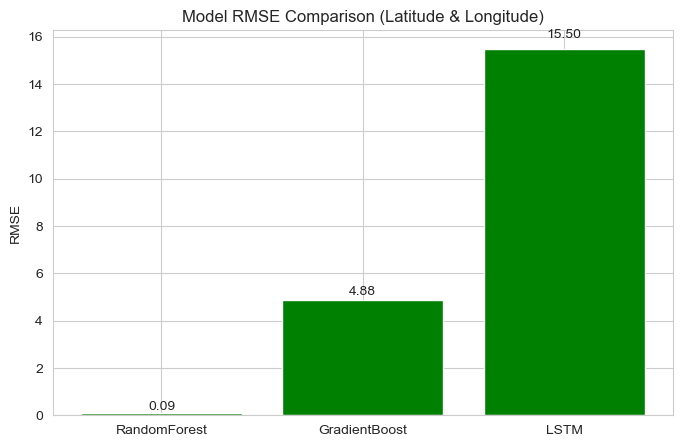

In [54]:
model_names = ["RandomForest", "GradientBoost", "LSTM"]
model_rmse = [rmse_rf, rmse_gbr, rmse_lstm]  # from the steps above

plt.figure(figsize=(8,5))
bars = plt.bar(model_names, model_rmse, color='green')
plt.title("Model RMSE Comparison (Latitude & Longitude)")
plt.ylabel("RMSE")
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., 1.02*height,
             f"{height:.2f}", ha='center', va='bottom')
plt.show()

In [59]:
FEA= (X.columns, feature_importance)

In [60]:
FEA

(Index(['location-long', 'location-lat', 'external-temperature', 'gps:hdop',
        'gps:satellite-count', 'heading', 'height-above-ellipsoid',
        'tag-local-identifier', 'tp', 'u10', 'v10', 't2m', 'sp'],
       dtype='object'),
 array([7.28448100e-05, 3.07047565e-04, 3.88785833e-04, 7.63955379e-07,
        1.18141603e-07, 2.14411047e-07, 2.42461664e-06, 9.72026832e-04,
        9.34216053e-02, 1.50716731e-01, 2.80053914e-01, 9.14696124e-02,
        3.82593911e-01]))

In [61]:
FE=pd.DataFrame(FEA)

In [62]:
FE

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,location-long,location-lat,external-temperature,gps:hdop,gps:satellite-count,heading,height-above-ellipsoid,tag-local-identifier,tp,u10,v10,t2m,sp
1,0.000073,0.000307,0.000389,0.000001,0.0,0.0,0.000002,0.000972,0.093422,0.150717,0.280054,0.09147,0.382594
